In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Importing ***Libraries***

In [ ]:
!pip install ydata-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.5/359.5 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 12.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 43.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 23.4 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=31721ecfed01d0a4ebeb16d685fc6876fb0a7d9c9c9effcd6bac852da3573cdd
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from ydata_profiling import ProfileReport as pr
import warnings
warnings.filterwarnings("ignore")


# ***Data Acquisition***




In [ ]:
df_cardio=pd.read_csv('/content/drive/MyDrive/cadiovascular.csv')
df_cardio.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,No,16.60,Yes,No,No,3.0,30.0,No,Female,55-59,White,Yes,Yes,Very good,5.0,Yes,No,Yes
1,No,20.34,No,No,Yes,0.0,0.0,No,Female,80 or older,White,No,Yes,Very good,7.0,No,No,No
2,No,26.58,Yes,No,No,20.0,30.0,No,Male,65-69,White,Yes,Yes,Fair,8.0,Yes,No,No
3,No,24.21,No,No,No,0.0,0.0,No,Female,75-79,White,No,No,Good,6.0,No,No,Yes
4,No,23.71,No,No,No,28.0,0.0,Yes,Female,40-44,White,No,Yes,Very good,8.0,No,No,No


In [ ]:
df_orginal=df_cardio.copy()

In [ ]:
df_cardio.tail()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
319790,Yes,27.41,Yes,No,No,7.0,0.0,Yes,Male,60-64,Hispanic,Yes,No,Fair,6.0,Yes,No,No
319791,No,29.84,Yes,No,No,0.0,0.0,No,Male,35-39,Hispanic,No,Yes,Very good,5.0,Yes,No,No
319792,No,24.24,No,No,No,0.0,0.0,No,Female,45-49,Hispanic,No,Yes,Good,6.0,No,No,No
319793,No,32.81,No,No,No,0.0,0.0,No,Female,25-29,Hispanic,No,No,Good,12.0,No,No,No
319794,No,46.56,No,No,No,0.0,0.0,No,Female,80 or older,Hispanic,No,Yes,Good,8.0,No,No,No


# **DATASET OVERVIEW**

In [ ]:
df_cardio.shape

(319795, 18)

In [ ]:
df_cardio.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319795 entries, 0 to 319794
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   HeartDisease      319795 non-null  object 
 1   BMI               319795 non-null  float64
 2   Smoking           319795 non-null  object 
 3   AlcoholDrinking   319795 non-null  object 
 4   Stroke            319795 non-null  object 
 5   PhysicalHealth    319795 non-null  float64
 6   MentalHealth      319795 non-null  float64
 7   DiffWalking       319795 non-null  object 
 8   Sex               319795 non-null  object 
 9   AgeCategory       319795 non-null  object 
 10  Race              319795 non-null  object 
 11  Diabetic          319795 non-null  object 
 12  PhysicalActivity  319795 non-null  object 
 13  GenHealth         319795 non-null  object 
 14  SleepTime         319795 non-null  float64
 15  Asthma            319795 non-null  object 
 16  KidneyDisease     31

In [ ]:
df_cardio.describe(include='all')

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
count,319795,319795.000000,319795,319795,319795,319795.00000,319795.000000,319795,319795,319795,319795,319795,319795,319795,319795.000000,319795,319795,319795
unique,2,NaN,2,2,2,NaN,NaN,2,2,13,6,4,2,5,NaN,2,2,2
top,No,NaN,No,No,No,NaN,NaN,No,Female,65-69,White,No,Yes,Very good,NaN,No,No,No
freq,292422,NaN,187887,298018,307726,NaN,NaN,275385,167805,34151,245212,269653,247957,113858,NaN,276923,308016,289976
mean,NaN,28.325399,NaN,NaN,NaN,3.37171,3.898366,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.097075,NaN,NaN,NaN
std,NaN,6.356100,NaN,NaN,NaN,7.95085,7.955235,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.436007,NaN,NaN,NaN
min,NaN,12.020000,NaN,NaN,NaN,0.00000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN
25%,NaN,24.030000,NaN,NaN,NaN,0.00000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.000000,NaN,NaN,NaN
50%,NaN,27.340000,NaN,NaN,NaN,0.00000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.000000,NaN,NaN,NaN
75%,NaN,31.420000,NaN,NaN,NaN,2.00000,3.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.000000,NaN,NaN,NaN


looking at our dataset we have 319795 samples . the majority of features are categorical .BMI is skewed(not straight).
physicalhealth and lentalhealth are both very skewed looking t the number of zeros.
sleeptime is normally distributed.race is imbalenced and the majority of beings are white .
the rest of the features are imbalenced.

# ***CONVERTING VALUES OF THE DATASET***

In [ ]:
df_cardio['AgeCategory'].value_counts()

AgeCategory
65-69          34151
60-64          33686
70-74          31065
55-59          29757
50-54          25382
80 or older    24153
45-49          21791
75-79          21482
18-24          21064
40-44          21006
35-39          20550
30-34          18753
25-29          16955
Name: count, dtype: int64

In [ ]:
df=df_cardio.copy()

In [ ]:
df['AgeCategory']=df['AgeCategory'].str[:2]

In [ ]:
df['GenHealth'].value_counts()

GenHealth
Very good    113858
Good          93129
Excellent     66842
Fair          34677
Poor          11289
Name: count, dtype: int64

In [ ]:
df['GenHealth']=df['GenHealth'].replace('Poor','0')
df['GenHealth']=df['GenHealth'].replace('Fair','1')
df['GenHealth']=df['GenHealth'].replace('Good','2')
df['GenHealth']=df['GenHealth'].replace('Very good','3')
df['GenHealth']=df['GenHealth'].replace('Excellent','4')

In [ ]:
df['GenHealth'].value_counts()

GenHealth
3    113858
2     93129
4     66842
1     34677
0     11289
Name: count, dtype: int64

In [ ]:
df['GenHealth'] = df['GenHealth'].astype(int)

In [ ]:
df.dtypes

HeartDisease         object
BMI                 float64
Smoking              object
AlcoholDrinking      object
Stroke               object
PhysicalHealth      float64
MentalHealth        float64
DiffWalking          object
Sex                  object
AgeCategory          object
Race                 object
Diabetic             object
PhysicalActivity     object
GenHealth             int64
SleepTime           float64
Asthma               object
KidneyDisease        object
SkinCancer           object
dtype: object

In [ ]:
df_cardio['Diabetic'].value_counts()

Diabetic
No                         269653
Yes                         40802
No, borderline diabetes      6781
Yes (during pregnancy)       2559
Name: count, dtype: int64

In [ ]:
df['Diabetic']=df['Diabetic'].replace('No, borderline diabetes','2')
df['Diabetic']=df['Diabetic'].replace('Yes (during pregnancy)','3')
df['Diabetic']=df['Diabetic'].replace('Yes','1')
df['Diabetic']=df['Diabetic'].replace('No','0')

In [ ]:
df['Diabetic'] = df['Diabetic'].astype(int)

In [ ]:
df['Diabetic'].value_counts()

Diabetic
0    269653
1     40802
2      6781
3      2559
Name: count, dtype: int64

In [ ]:
df=df.replace('No','0')
df=df.replace('Yes','1')

In [ ]:
df.dtypes

HeartDisease         object
BMI                 float64
Smoking              object
AlcoholDrinking      object
Stroke               object
PhysicalHealth      float64
MentalHealth        float64
DiffWalking          object
Sex                  object
AgeCategory          object
Race                 object
Diabetic              int64
PhysicalActivity     object
GenHealth             int64
SleepTime           float64
Asthma               object
KidneyDisease        object
SkinCancer           object
dtype: object

In [ ]:
df['Sex'].value_counts()

Sex
Female    167805
Male      151990
Name: count, dtype: int64

In [ ]:
df['Sex']=df['Sex'].replace('Female',0)
df['Sex']=df['Sex'].replace('Male',1)

In [ ]:
df['Sex'] = df['Sex'].astype(int)

In [ ]:
df['Race'].value_counts()

Race
White                             245212
Hispanic                           27446
Black                              22939
Other                              10928
Asian                               8068
American Indian/Alaskan Native      5202
Name: count, dtype: int64

In [ ]:
df['Race']=df['Race'].replace('White',1)
df['Race']=df['Race'].replace('Hispanic',2)
df['Race']=df['Race'].replace('Black',3)
df['Race']=df['Race'].replace('Other',4)
df['Race']=df['Race'].replace('Asian',5)
df['Race']=df['Race'].replace('American Indian/Alaskan Native',6)



In [ ]:
df['Race'] = df['Race'].astype(int)

In [ ]:
df.dtypes

HeartDisease         object
BMI                 float64
Smoking              object
AlcoholDrinking      object
Stroke               object
PhysicalHealth      float64
MentalHealth        float64
DiffWalking          object
Sex                   int64
AgeCategory          object
Race                  int64
Diabetic              int64
PhysicalActivity     object
GenHealth             int64
SleepTime           float64
Asthma               object
KidneyDisease        object
SkinCancer           object
dtype: object

In [ ]:
df['HeartDisease'] = df['HeartDisease'].astype(int)
df['Smoking'] = df['Smoking'].astype(int)
df['AlcoholDrinking'] = df['AlcoholDrinking'].astype(int)
df['Stroke'] = df['Stroke'].astype(int)
df['DiffWalking'] = df['DiffWalking'].astype(int)
df['AgeCategory'] = df['AgeCategory'].astype(int)
df['PhysicalActivity'] = df['PhysicalActivity'].astype(int)
df['Asthma'] = df['Asthma'].astype(int)
df['KidneyDisease'] = df['KidneyDisease'].astype(int)
df['SkinCancer'] = df['SkinCancer'].astype(int)


In [ ]:
df.dtypes

HeartDisease          int64
BMI                 float64
Smoking               int64
AlcoholDrinking       int64
Stroke                int64
PhysicalHealth      float64
MentalHealth        float64
DiffWalking           int64
Sex                   int64
AgeCategory           int64
Race                  int64
Diabetic              int64
PhysicalActivity      int64
GenHealth             int64
SleepTime           float64
Asthma                int64
KidneyDisease         int64
SkinCancer            int64
dtype: object

In [ ]:
df

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,0,16.60,1,0,0,3.0,30.0,0,0,55,1,1,1,3,5.0,1,0,1
1,0,20.34,0,0,1,0.0,0.0,0,0,80,1,0,1,3,7.0,0,0,0
2,0,26.58,1,0,0,20.0,30.0,0,1,65,1,1,1,1,8.0,1,0,0
3,0,24.21,0,0,0,0.0,0.0,0,0,75,1,0,0,2,6.0,0,0,1
4,0,23.71,0,0,0,28.0,0.0,1,0,40,1,0,1,3,8.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319790,1,27.41,1,0,0,7.0,0.0,1,1,60,2,1,0,1,6.0,1,0,0
319791,0,29.84,1,0,0,0.0,0.0,0,1,35,2,0,1,3,5.0,1,0,0
319792,0,24.24,0,0,0,0.0,0.0,0,0,45,2,0,1,2,6.0,0,0,0
319793,0,32.81,0,0,0,0.0,0.0,0,0,25,2,0,0,2,12.0,0,0,0


# ***DATA FILTERING***

In [ ]:
#removing the missing values
df.isnull().sum()

HeartDisease        0
BMI                 0
Smoking             0
AlcoholDrinking     0
Stroke              0
PhysicalHealth      0
MentalHealth        0
DiffWalking         0
Sex                 0
AgeCategory         0
Race                0
Diabetic            0
PhysicalActivity    0
GenHealth           0
SleepTime           0
Asthma              0
KidneyDisease       0
SkinCancer          0
dtype: int64

there is no missing values in our dataset

In [ ]:
df.duplicated().sum()

18078

In [ ]:
df.drop_duplicates(inplace=True)

In [ ]:
df.duplicated().sum()

0

# ***Exploratory Data Analysis(EDA)***

In [ ]:
pr(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

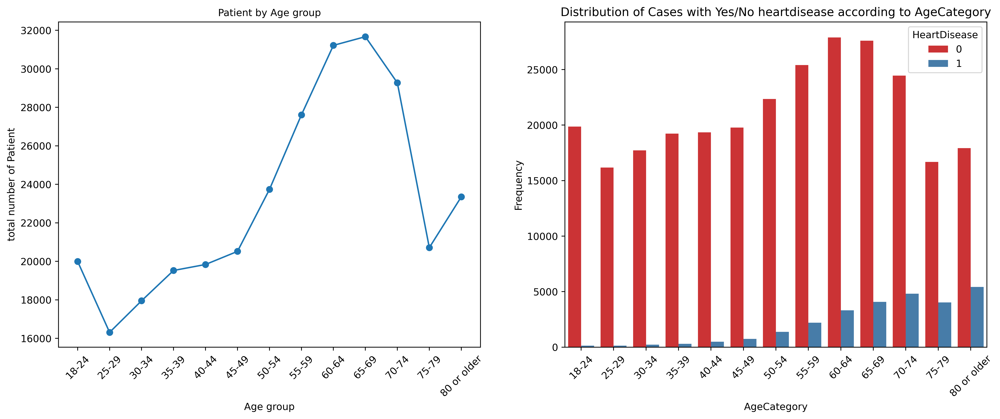

In [ ]:
age_plot = df.groupby(["AgeCategory"])
Patient_groupby_age= {}
for age, group in age_plot:
    Patient_groupby_age[age]=(group["AgeCategory"].count())


x_axis = np.arange(0, len(Patient_groupby_age.keys()) )
ageCategory_order =['18-24', '25-29', '30-34','35-39', '40-44', '45-49', '50-54', '55-59', '60-64', '65-69', '70-74','75-79', '80 or older']

fig , axes= plt.subplots(1,2, figsize=(17,6),dpi=500)
ax=plt.subplot(1,2,1 )
ax0=plt.plot(x_axis, Patient_groupby_age.values(), marker="o")
ax.set_xticks(x_axis)
ax.set_xticklabels(ageCategory_order)
plt.title("Patient by Age group",size=10,)
plt.xlabel("Age group")
plt.ylabel("total number of Patient")
plt.xticks(rotation=45)





ax=plt.subplot(1,2,2 )
order = pd.unique(df.AgeCategory.values)
order.sort()
ax1=sns.countplot(data=df, x='AgeCategory', hue='HeartDisease', palette='Set1', order=order)
plt.title("Distribution of Cases with Yes/No heartdisease according to AgeCategory")
plt.xlabel('AgeCategory')
ax.set_xticks(x_axis)
ax.set_xticklabels(ageCategory_order)
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

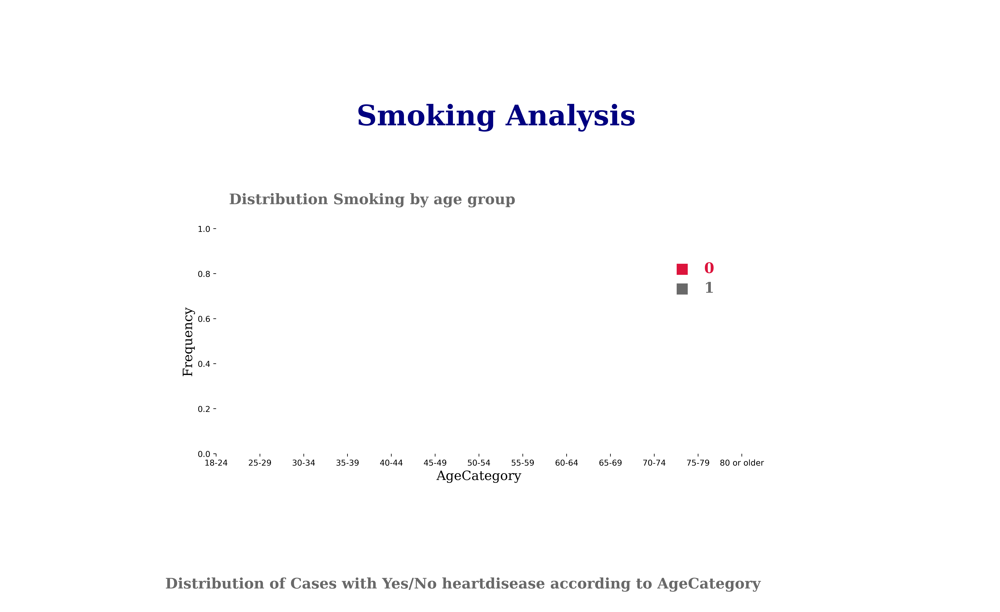

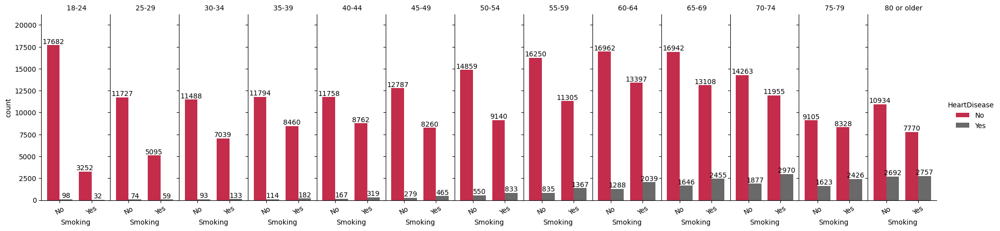

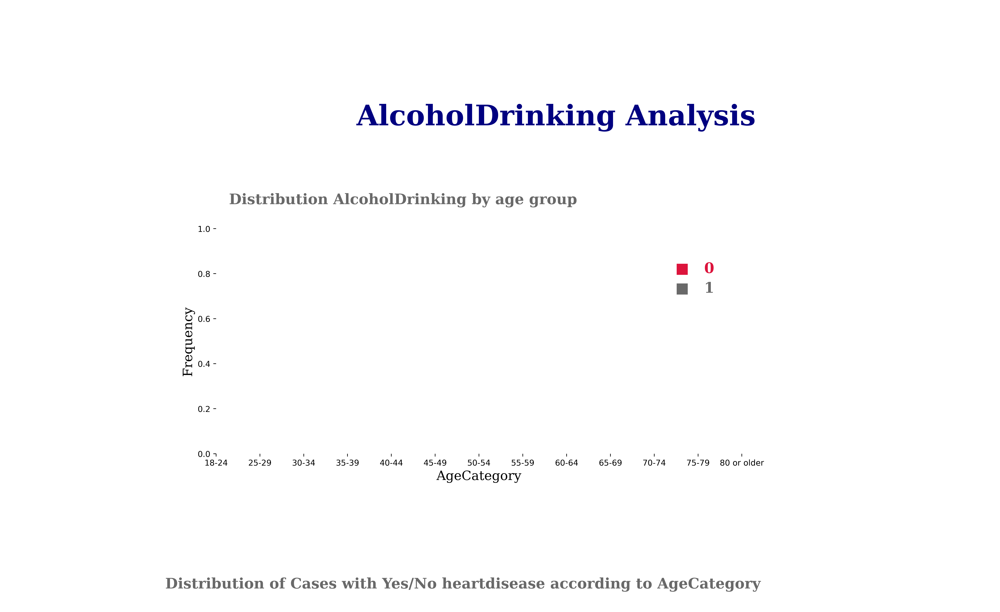

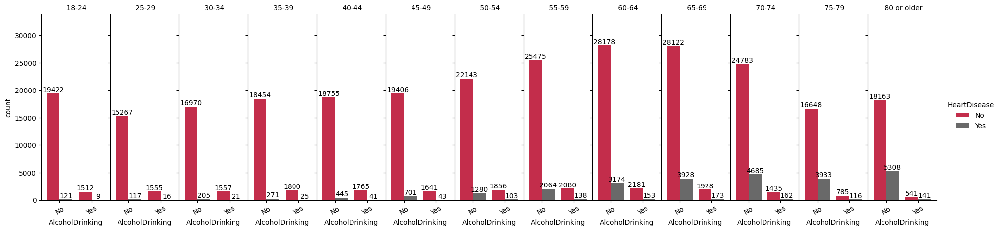

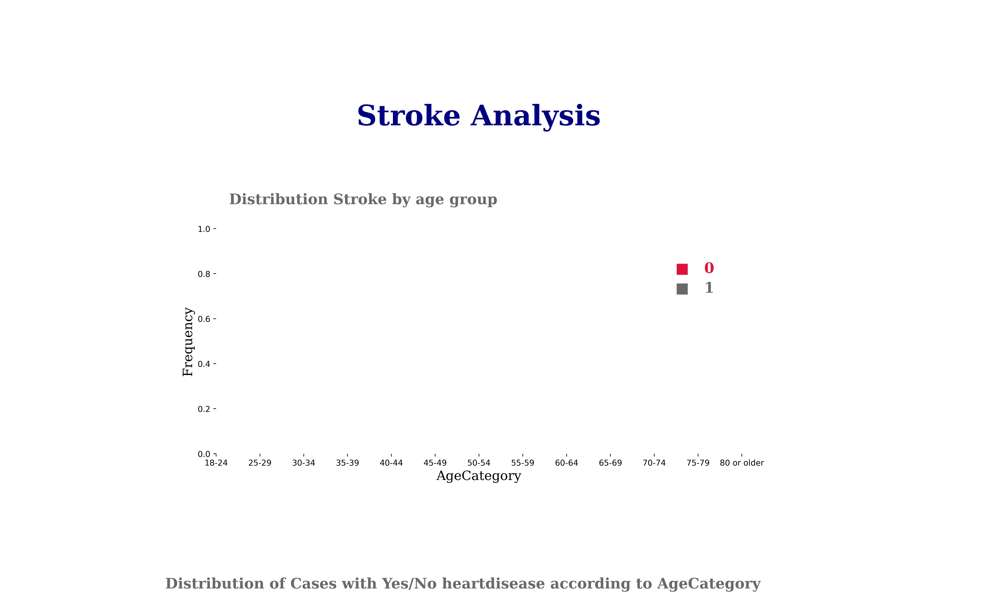

...

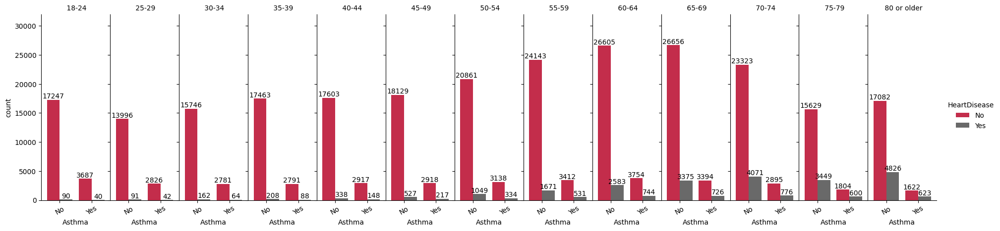

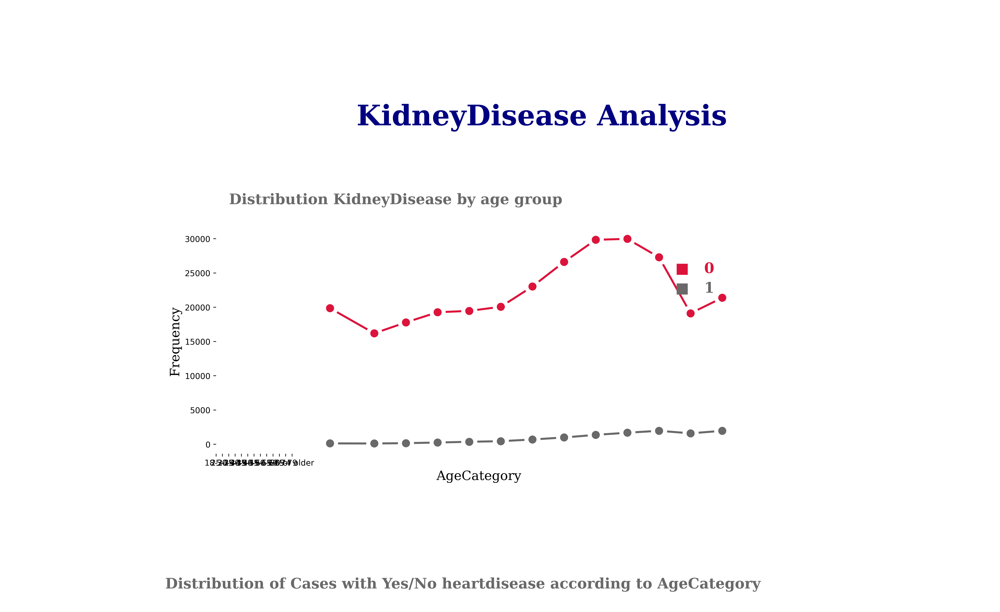

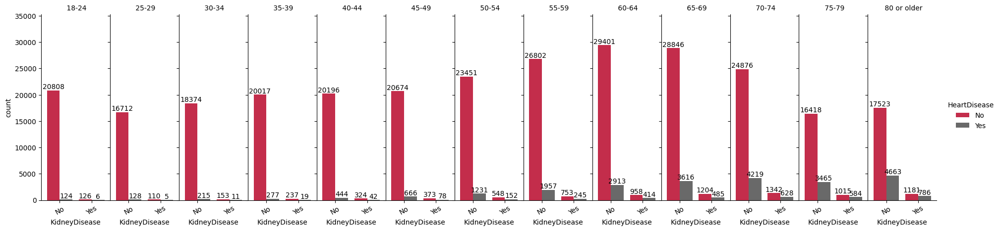

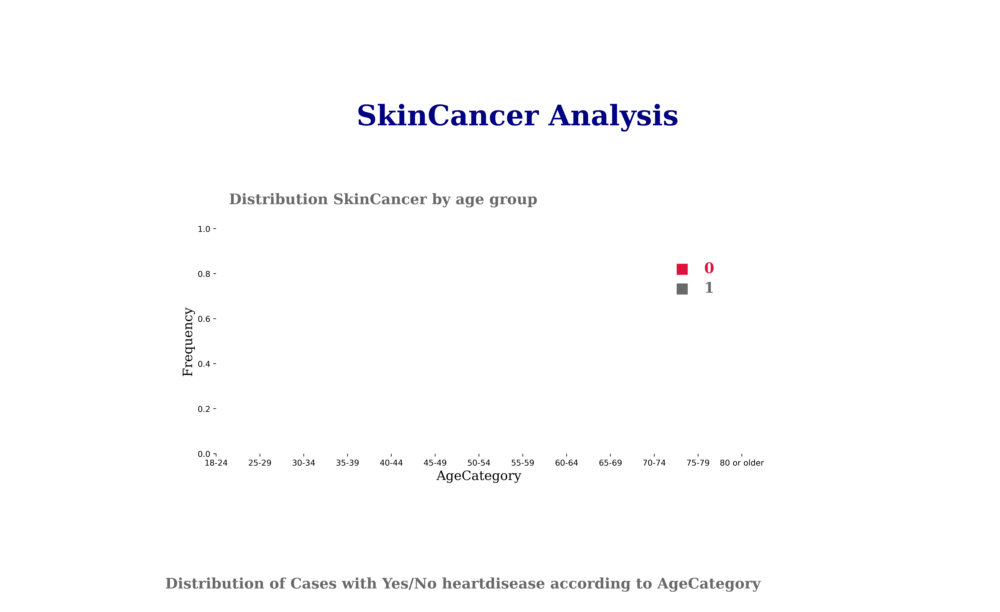

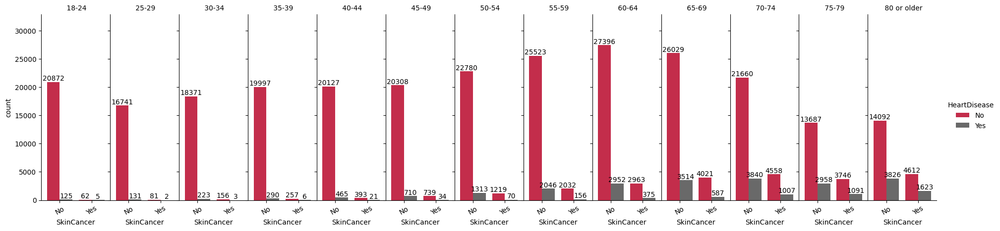

In [ ]:
color_catplot=["Crimson","DimGray"]
column_name=[ 'Smoking', 'AlcoholDrinking', 'Stroke', 'DiffWalking', 'Sex','PhysicalActivity','Asthma', 'KidneyDisease', 'SkinCancer']
df_sorted=df_cardio.sort_values('AgeCategory')
X_tuple=tuple(tuple (x_axis))


for column in column_name:

    fig = plt.figure(figsize = (22,17),dpi=500)

    gs = fig.add_gridspec(10,24)
    gs.update(wspace = 1, hspace = 0.05)


    ax2 = fig.add_subplot(gs[0:3,5:18]) #distribution plot
    ax1 = fig.add_subplot(gs[4:5,0:]) #dumbbell plot

    # axes list
    axes = [ax1,ax2]

    # setting of axes; visibility of axes and spines turn off
    for ax in axes:
        ax.axes.get_yaxis().set_visible(False)
        ax.set_facecolor('#FFFFFF')

        for loc in ['left', 'right', 'top', 'bottom']:
            ax.spines[loc].set_visible(False)

    fig.patch.set_facecolor('#FFFFFF')

    ax1.axes.get_xaxis().set_visible(False)
    ax2.axes.get_yaxis().set_visible(True)
    ax1.set_xlim(xmin = -250,xmax = 2000)
    ax1.set_ylim(ymin = -1,ymax =3.5)

    # catplot

    g=sns.catplot(x=column , hue="HeartDisease", col="AgeCategory",data=df_sorted,
                kind="count", height=5, aspect=.3, palette=color_catplot, ax=ax1)


    for ax in g.axes.flat[1:]:
        sns.despine(ax=ax, left=False)
    for ax in g.axes.flat:
        ax.set_xlabel(ax.get_title())
        ax.set_title('')
        ax.margins(x=0.1) # slightly more margin as a separation
        ax.tick_params(axis='x', labelrotation=30)
    for ax in g.axes.ravel():

        # add annotations
        for c in ax.containers:
            # add custom labels with the labels=labels parameter if needed
            # labels = [f'{h}' if (h := v.get_height()) > 0 else '' for v in c]
            ax.bar_label(c, label_type='edge')
        ax.margins(y=0.2)

        #title for each
    g.set_titles( col_template=' {col_name}')

    plt.subplots_adjust(wspace=0, bottom=0.18, left=0.06)

        #Remove lable form below of each
    g.set_xlabels()



    # lineplot
    column_plot_first =   df[df[column] == "0"]['AgeCategory'].value_counts().sort_index(axis = 0)
    column_plot_second= df[df[column] == "1"]['AgeCategory'].value_counts().sort_index(axis = 0)

    sns.lineplot( column_plot_first, marker="o", color="Crimson", linewidth = 2.5,ms=15,mew=5 ,ax = ax2)
    sns.lineplot( column_plot_second, marker="o", color="DimGray",linewidth = 2.5,ms=15,mew=5, ax = ax2)



    ax2.set_xlabel('AgeCategory', fontdict = {'font':'Serif', 'color': 'black', 'size': 16 })
    ax2.set_xticks(x_axis)
    ax2.set_xticklabels(ageCategory_order)
    ax2.set_ylabel('Frequency',fontdict = {'font':'Serif', 'color': 'black', 'size': 16})






    fig.text(0.4,0.985, column +" Analysis" ,{'font':'Serif', 'weight':'bold','color': 'Navy', 'size':35})
    fig.text(0.4, 1.1, " ")
    fig.text(0.65,0.835, '■   0 ', {'font': 'Serif','weight':'bold','size': '18','weight':'bold','style':'normal', 'color':"Crimson"})
    fig.text(0.65,0.815, '■   1', {'font': 'Serif','weight':'bold','size': '18','weight':'bold','style':'normal', 'color':"DimGray"})
    fig.text(0.3,0.905, 'Distribution '+column+' by age group', {'font': 'Serif','weight':'bold','size': '18','weight':'bold','style':'normal', 'color':"DimGray"})
    fig.text(0.25,0.515, 'Distribution of Cases with Yes/No heartdisease according to AgeCategory', {'font': 'Serif','weight':'bold','size': '18','weight':'bold','style':'normal', 'color':"DimGray"})

    fig.show()

In [ ]:
import pandas as pd

# Load your dataset into a pandas DataFrame (replace 'df' with your DataFrame name)
# For example:
# df = pd.read_csv('your_dataset.csv')

# Assuming 'target' is the name of your target variable (replace 'target' with your target variable name)
class_counts = df['HeartDisease'].value_counts()

# Display the counts of each class
print("Class Counts:")
print(class_counts)

# Calculate the ratio of instances for each class
class_ratios = class_counts / df.shape[0]

# Display the ratios of each class
print("\nClass Ratios:")
print(class_ratios)


Class Counts:
HeartDisease
0    274456
1     27261
Name: count, dtype: int64

Class Ratios:
HeartDisease
0    0.909647
1    0.090353
Name: count, dtype: float64


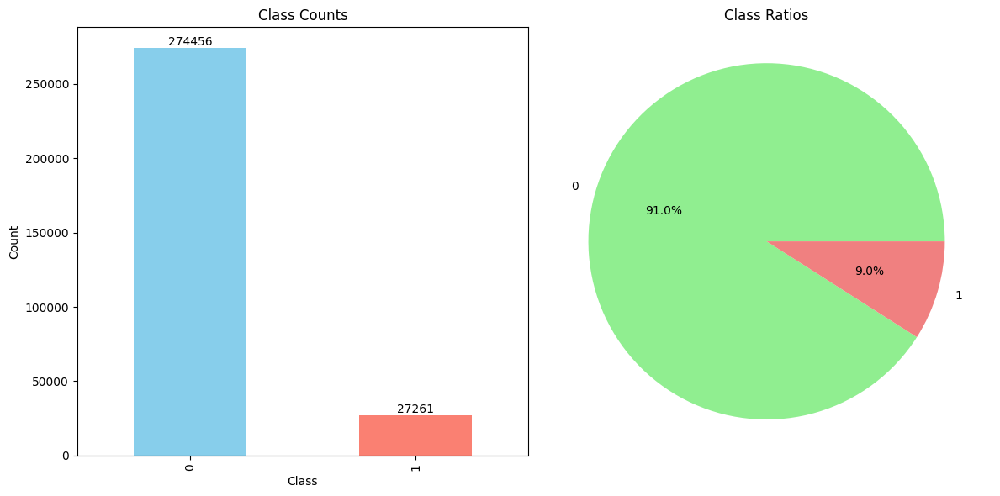

In [ ]:
import matplotlib.pyplot as plt

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Plot the class counts as a bar plot
class_counts.plot(kind='bar', ax=ax1, color=['skyblue', 'salmon'])
ax1.set_title('Class Counts')
ax1.set_xlabel('Class')
ax1.set_ylabel('Count')

# Add labels to the bars
for i, v in enumerate(class_counts):
    ax1.text(i, v + 5, str(v), ha='center', va='bottom')

# Plot the class ratios as a pie chart
ax2.pie(class_ratios, labels=class_ratios.index, autopct='%1.1f%%', colors=['lightgreen', 'lightcoral'])
ax2.axis('equal')  # Equal aspect ratio ensures that pie is circular.
ax2.set_title('Class Ratios')

# Adjust spacing between subplots
plt.tight_layout()

# Display the plots
plt.show()

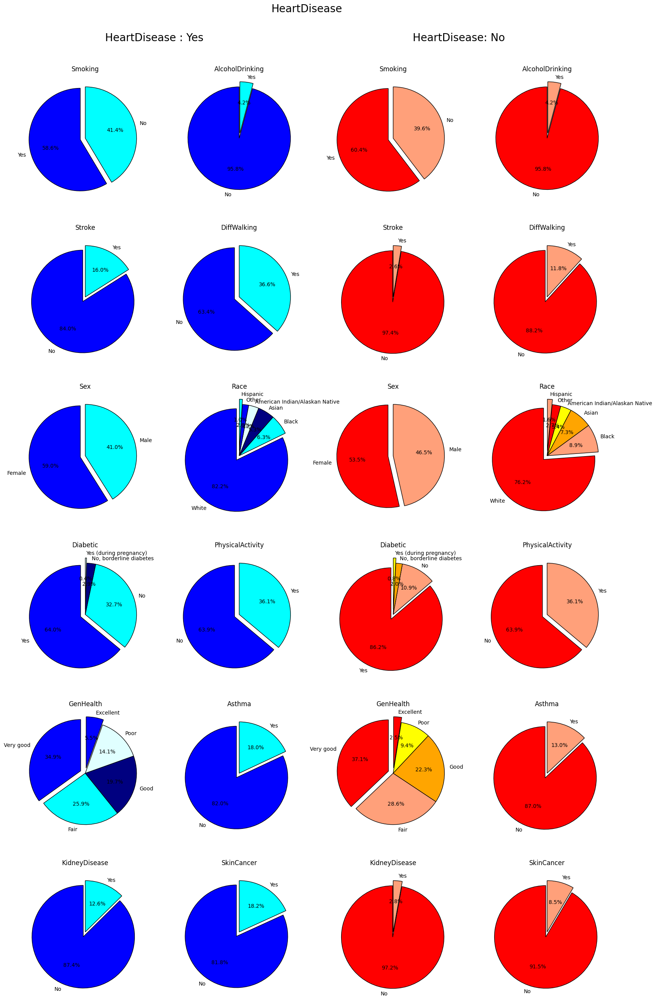

In [ ]:
color_ye=['Blue',  'Cyan',"navy",'LightCyan',]
CustomPalette_ye = sns.set_palette(sns.color_palette(color_ye))

color_no=["red","LightSalmon","orange","yellow"]
CustomPalette_ye = sns.set_palette(sns.color_palette(color_no))

Smoking = df_cardio[df_cardio['HeartDisease'] == "Yes"]['Smoking'].value_counts()
Smoking = [Smoking[0] / sum(Smoking) * 100, Smoking[1] / sum(Smoking) * 100] # No - Yes

AlcoholDrinking = df_cardio[df_cardio['HeartDisease'] == "Yes"]['AlcoholDrinking'].value_counts()
AlcoholDrinking = [AlcoholDrinking[0] / sum(AlcoholDrinking) * 100,AlcoholDrinking[1] / sum(AlcoholDrinking) * 100] # No - Yes

Stroke  = df_cardio[df_cardio['HeartDisease'] == "Yes"]['Stroke'].value_counts()
Stroke = [Stroke[0] / sum(Stroke) * 100,Stroke[1] / sum(Stroke) * 100] # No - Yes

DiffWalking  = df_cardio[df_cardio['HeartDisease'] == "Yes"]['DiffWalking'].value_counts()
DiffWalking = [DiffWalking[0] / sum(DiffWalking) * 100,DiffWalking[1] / sum(DiffWalking) * 100] # No - Yes


Sex  = df_cardio[df_cardio['HeartDisease'] == "Yes"]['Sex'].value_counts()
Sex = [Sex[0] / sum(Sex) * 100, Sex[1] / sum(Sex) * 100] # Female - Male

Race  =df_cardio[df_cardio['HeartDisease'] == "Yes"]['Race'].value_counts()
Race  = [Race[0] / sum(Race) * 100,Race[1] / sum(Race) * 100, Race[2] / sum(Race) * 100,Race[3] / sum(Race) * 100,Race[4] / sum(Race) * 100, Race[5] / sum(Race) * 100] # 'White', 'Black', 'Asian', 'American Indian/Alaskan Native','Other', 'Hispanic'

Diabetic = df_cardio[df_cardio['HeartDisease'] == "Yes"]['Diabetic'].value_counts()
Diabetic = [Diabetic[0] / sum(Diabetic) * 100,Diabetic[1] / sum(Diabetic) * 100, Diabetic[2] / sum(Diabetic) * 100,Diabetic[3] / sum(Diabetic) * 100] # 'Yes', 'No', 'No, borderline diabetes', 'Yes (during pregnancy)'

PhysicalActivity  = df_cardio[df_cardio['HeartDisease'] == "Yes"]['PhysicalActivity'].value_counts()
PhysicalActivity = [PhysicalActivity[0] / sum(PhysicalActivity) * 100,PhysicalActivity[1] / sum(PhysicalActivity) * 100] # No - Yes

GenHealth  = df_cardio[df_cardio['HeartDisease'] == "Yes"]['GenHealth'].value_counts()
GenHealth  = [GenHealth[0] / sum(GenHealth) * 100,GenHealth[1] / sum(GenHealth) * 100, GenHealth[2] / sum(GenHealth) * 100,GenHealth[3] / sum(GenHealth) * 100, GenHealth[4] / sum(GenHealth) * 100] #'Very good', 'Fair', 'Good', 'Poor', 'Excellent'

Asthma  = df_cardio[df_cardio['HeartDisease'] == "Yes"]['Asthma'].value_counts()
Asthma = [Asthma[0] / sum(Asthma) * 100,Asthma[1] / sum(Asthma) * 100] # No - Yes

KidneyDisease  = df_cardio[df_cardio['HeartDisease'] == "Yes"]['KidneyDisease'].value_counts()
KidneyDisease = [KidneyDisease[0] / sum(KidneyDisease) * 100,KidneyDisease[1] / sum(KidneyDisease) * 100] # No - yes

SkinCancer = df_cardio[df_cardio['HeartDisease'] == "Yes"]['SkinCancer'].value_counts()
SkinCancer = [SkinCancer[0] / sum(SkinCancer) * 100,SkinCancer[1] / sum(SkinCancer) * 100] # No - Yes

#########

Smokingn = df_cardio[df_cardio['HeartDisease'] == "No"]['Smoking'].value_counts()
Smokingn = [Smokingn[0] / sum(Smokingn) * 100, Smokingn[1] / sum(Smokingn) * 100] # No - Yes

AlcoholDrinkingn = df_cardio[df_cardio['HeartDisease'] == "Yes"]['AlcoholDrinking'].value_counts()
AlcoholDrinkingn = [AlcoholDrinkingn[0] / sum(AlcoholDrinkingn) * 100,AlcoholDrinkingn[1] / sum(AlcoholDrinkingn) * 100] # No - Yes

Stroken  = df_cardio[df_cardio['HeartDisease'] == "No"]['Stroke'].value_counts()
Stroken = [Stroken[0] / sum(Stroken) * 100,Stroken[1] / sum(Stroken) * 100] # No - Yes

DiffWalkingn  = df_cardio[df_cardio['HeartDisease'] == "No"]['DiffWalking'].value_counts()
DiffWalkingn= [DiffWalkingn[0] / sum(DiffWalkingn) * 100,DiffWalkingn[1] / sum(DiffWalkingn) * 100] # No - Yes


Sexn  = df_cardio[df_cardio['HeartDisease'] == "No"]['Sex'].value_counts()
Sexn = [Sexn[0] / sum(Sexn) * 100, Sexn[1] / sum(Sexn) * 100] # Female - Male

Racen  =df_cardio[df_cardio['HeartDisease'] == "No"]['Race'].value_counts()
Racen  = [Racen[0] / sum(Racen) * 100,Racen[1] / sum(Racen) * 100, Racen[2] / sum(Racen) * 100,Racen[3] / sum(Racen) * 100,Racen[4] / sum(Racen) * 100, Racen[5] / sum(Racen) * 100] # 'White', 'Black', 'Asian', 'American Indian/Alaskan Native','Other', 'Hispanic'

Diabeticn = df_cardio[df_cardio['HeartDisease'] == "No"]['Diabetic'].value_counts()
Diabeticn = [Diabeticn[0] / sum(Diabeticn) * 100,Diabeticn[1] / sum(Diabeticn) * 100, Diabeticn[2] / sum(Diabeticn) * 100,Diabeticn[3] / sum(Diabeticn) * 100] # 'Yes', 'No', 'No, borderline diabetes', 'Yes (during pregnancy)'

PhysicalActivityn  = df_cardio[df_cardio['HeartDisease'] == "Yes"]['PhysicalActivity'].value_counts()
PhysicalActivityn = [PhysicalActivityn[0] / sum(PhysicalActivityn) * 100,PhysicalActivityn[1] / sum(PhysicalActivityn) * 100] # No - Yes

GenHealthn  = df_cardio[df_cardio['HeartDisease'] == "No"]['GenHealth'].value_counts()
GenHealthn  = [GenHealthn[0] / sum(GenHealthn) * 100,GenHealthn[1] / sum(GenHealthn) * 100, GenHealthn[2] / sum(GenHealthn) * 100,GenHealthn[3] / sum(GenHealthn) * 100, GenHealthn[4] / sum(GenHealthn) * 100] #'Very good', 'Fair', 'Good', 'Poor', 'Excellent'

Asthman  = df_cardio[df_cardio['HeartDisease'] == "No"]['Asthma'].value_counts()
Asthman = [Asthman[0] / sum(Asthman) * 100,Asthman[1] / sum(Asthman) * 100] # No - Yes

KidneyDiseasen  = df_cardio[df_cardio['HeartDisease'] == "No"]['KidneyDisease'].value_counts()
KidneyDiseasen = [KidneyDiseasen[0] / sum(KidneyDiseasen) * 100,KidneyDiseasen[1] / sum(KidneyDiseasen) * 100] # No - yes

SkinCancern = df_cardio[df_cardio['HeartDisease'] == "No"]['SkinCancer'].value_counts()
SkinCancern = [SkinCancern[0] / sum(SkinCancern) * 100,SkinCancern[1] / sum(SkinCancern) * 100] # No - Yes

#########
ax,fig = plt.subplots(nrows = 6,ncols = 4,figsize = (20,30))


plt.subplot(6,4,1)
plt.pie(Smoking,labels = ['Yes','No'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = color_ye,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('Smoking');

plt.subplot(6,4,2)
plt.pie(AlcoholDrinking,labels = ['No', 'Yes'],autopct='%1.1f%%',startangle = 90,explode = (0,0.1),colors = color_ye,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('AlcoholDrinking');



plt.subplot(6,4,3)
plt.pie(Smokingn,labels = ['Yes','No'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = color_no,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('Smoking');

plt.subplot(6,4,4)
plt.pie(AlcoholDrinkingn,labels = ['No', 'Yes'],autopct='%1.1f%%',startangle = 90,explode = (0,0.1),colors = color_no,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('AlcoholDrinking');




plt.subplot(6,4,5)
plt.pie(Stroke,labels = ['No','Yes'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = color_ye,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True}) #
plt.title('Stroke');


plt.subplot(6,4,6)
plt.pie(DiffWalking,labels = ['No','Yes'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = color_ye,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('DiffWalking');



plt.subplot(6,4,7)
plt.pie(Stroken,labels = ['No','Yes'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = color_no,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True}) #
plt.title('Stroke');

plt.subplot(6,4,8)
plt.pie(DiffWalkingn,labels = ['No','Yes'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = color_no,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('DiffWalking');




plt.subplot(6,4,9)
plt.pie(Sex,labels = ['Female', 'Male'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = color_ye,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('Sex');

plt.subplot(6,4,10)
plt.pie(Race,labels = ['White', 'Black', 'Asian', 'American Indian/Alaskan Native','Other', 'Hispanic'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0,0,0,0,0.1),colors = color_ye,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('Race');


plt.subplot(6,4,11)
plt.pie(Sexn,labels = ['Female', 'Male'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = color_no,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('Sex');

plt.subplot(6,4,12)
plt.pie(Racen,labels = ['White', 'Black', 'Asian', 'American Indian/Alaskan Native','Other', 'Hispanic'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0,0,0,0,0.1),colors = color_no,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('Race');




plt.subplot(6,4,13)
plt.pie(Diabetic,labels = ['Yes', 'No', 'No, borderline diabetes', 'Yes (during pregnancy)'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0,0,0.1),colors = color_ye,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('Diabetic');


plt.subplot(6,4,14)
plt.pie(PhysicalActivity,labels = ['No','Yes'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = color_ye,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('PhysicalActivity');


plt.subplot(6,4,15)
plt.pie(Diabeticn,labels = ['Yes', 'No', 'No, borderline diabetes', 'Yes (during pregnancy)'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0,0,0.1),colors = color_no,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('Diabetic');

plt.subplot(6,4,16)
plt.pie(PhysicalActivityn,labels = ['No','Yes'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = color_no,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('PhysicalActivity');




plt.subplot(6,4,17)
plt.pie(GenHealth,labels = ['Very good', 'Fair', 'Good', 'Poor', 'Excellent'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0,0,0,0.1),colors = color_ye,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('GenHealth');

plt.subplot(6,4,18)
plt.pie(Asthma,labels = ['No','Yes'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = color_ye,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('Asthma');

plt.subplot(6,4,19)
plt.pie(GenHealthn,labels = ['Very good', 'Fair', 'Good', 'Poor', 'Excellent'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0,0,0,0.1),colors = color_no,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('GenHealth');

plt.subplot(6,4,20)
plt.pie(Asthman,labels = ['No','Yes'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = color_no,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('Asthma');



plt.subplot(6,4,21)
plt.pie(KidneyDisease,labels = ['No','Yes'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = color_ye,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('KidneyDisease');

plt.subplot(6,4,22)
plt.pie(SkinCancer,labels = ['No','Yes'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = color_ye,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('SkinCancer');


plt.subplot(6,4,23)
plt.pie(KidneyDiseasen,labels = ['No','Yes'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = color_no,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('KidneyDisease');

plt.subplot(6,4,24)
plt.pie(SkinCancern,labels = ['No','Yes'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = color_no,
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('SkinCancer');





plt.figtext(0.3,0.95,"HeartDisease : Yes", va="center", ha="center", size=20)
plt.figtext(0.7,0.95,"HeartDisease: No", va="center", ha="center", size=20)



plt.suptitle('HeartDisease',fontsize=20)
plt.subplots_adjust(top=0.92)

plt.show()

# ***MODELING***

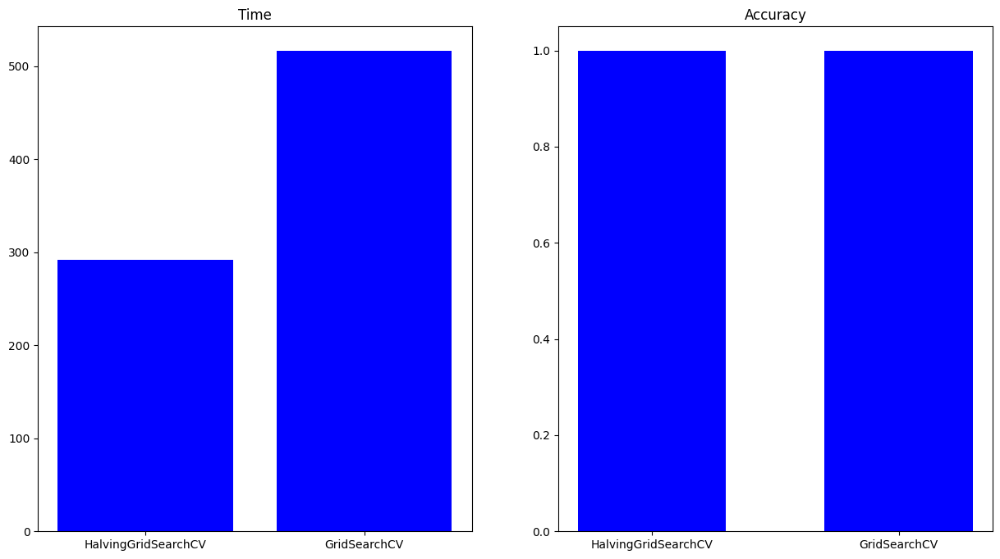

In [ ]:
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingGridSearchCV, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.metrics import accuracy_score
import time

colors = [ 'Blue',  'Cyan',"navy",'LightCyan',]
CustomPalette = sns.set_palette(sns.color_palette(colors))

# Create a synthetic dataset
X, y = make_classification(n_samples=3000, n_features=20, n_informative=2, random_state=42)

# Define the model and parameter grid
model = RandomForestClassifier(random_state=42)
param_grid = {'n_estimators': [ 50, 100, 200,400], 'max_depth': [None, 10,  30, 90], 'criterion': ['gini', 'entropy']}

# Set up HalvingGridSearchCV
search_halving = HalvingGridSearchCV(model, param_grid, cv=10, resource='n_samples', aggressive_elimination=True)

# Set up GridSearchCV
search_normal = GridSearchCV(model, param_grid, cv=10)

# Fit the data and measure the time for HalvingGridSearchCV
start1 = time.time()
halvpredict=search_halving.fit(X, y)
y_pred_halv=halvpredict.predict(X)
accuracy_halv=accuracy_score(y, y_pred_halv)
end1 = time.time()
halv=end1- start1
#print("HalvingGridSearchCV Time:", end1- start1)

# Fit the data and measure the time for GridSearchCV
start2 = time.time()
gridpredict=search_normal.fit(X, y)
y_pred_grid=gridpredict.predict(X)
accuracy_grid=accuracy_score(y, y_pred_grid)
end2 = time.time()
grid=end2 - start2
#print("GridSearchCV Time:", end2 - start2)


tune = np.array(["HalvingGridSearchCV", "GridSearchCV"])
time= np.array([halv, grid])

fig = plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.bar(tune,time, color =CustomPalette )
plt.title("Time",fontsize=12)


accu = np.array([accuracy_halv,accuracy_grid])

plt.subplot(1, 2, 2)
plt.bar(tune,accu ,color =CustomPalette, width = 0.6 )
plt.title("Accuracy",fontsize=12)

plt.show()

In [ ]:
from sklearn.model_selection import  cross_val_score
from sklearn.experimental import enable_halving_search_cv

from sklearn.model_selection import HalvingGridSearchCV
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score
from sklearn.base import clone
from sklearn.model_selection import StratifiedKFold

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

In [ ]:
X=df.drop(['HeartDisease'], axis=1)
y=df['HeartDisease']

In [ ]:
#Use "make_scorer" to convert a metric to scorer
def f1_metric(model, X_train, y_train):
        return f1_score(y_train, model.predict(X_train), average='binary')

In [ ]:
def Featureimportance(model, X_train, y_train, random_state=0):
    # list containing feature importances
    importances = []
    # Clone the model
    model_clone = clone(model)
    # Set random_state for comparability
    model_clone.random_state = random_state
    # Train the model
    model_clone.fit(X_train, y_train)
    # Create the cross-validation object using StratifiedKFold
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
    # Score the benchmark model using cross-validation
    benchmark_score = cross_val_score(model_clone, X_train, y_train, cv=cv, scoring=f1_metric).mean()


    # Iterate over all features and store feature importance
    for col in X_train.columns:
        # Clone the model
        model_clone = clone(model)
        # Set random_state for comparability
        model_clone.random_state = random_state
        # Traint the model on the the dataset with a single feature removed
        model_clone.fit(X_train.drop(col, axis = 1), y_train)

        # Score the droped-column model
        drop_column_score = cross_val_score(model_clone, X_train.drop(col,axis=1), y_train, cv=cv, scoring=f1_metric).mean()
        # Store feature importance which is defined as the difference between the benchmark and the new model score
        importances.append(benchmark_score - drop_column_score)

    # Return the features along with their importances in the form of a dataframe
    importances_df = pd.DataFrame({'feature': X_train.columns, 'feature importance': importances}) \
                     .sort_values('feature importance', ascending = False).reset_index(drop = True)

    return importances_df

In [ ]:
def plotFeatureimportance(model, X_train, y_train):
    # Call drop-column feature importance function
    df_drop_column = Featureimportance(model, X_train, y_train, random_state=0)
    # Rename columns
    df_drop_column.columns = ['Feature', 'Feature Importance']

    # Plot barchart
    plt.figure(figsize=(12,10))
    sns.barplot(data=df_drop_column, x='Feature Importance', y='Feature', orient='h',
                              color="white",
                              hatch='//',
                              edgecolor="darkred",
                              ecolor="black",
                              linewidth=0.6,)


    plt.xlabel("Feature Importance", size=16)
    plt.ylabel("Feature", size=16)
    plt.title(' Feature Importance', fontsize=20)
    plt.show()

In [ ]:
from sklearn.preprocessing import StandardScaler

def model_hypertun(model, param_grid, X, y):


    skf = StratifiedKFold(n_splits=7, shuffle=True, random_state=42)




    x_train, x_test, y_train, y_test=train_test_split(X,y,test_size=0.35)
    scaler= StandardScaler()
    scaler.fit(x_train)

    X_train_scaled = scaler.transform(x_train)
    X_test_scaled = scaler.transform(x_test)



    model_grid = HalvingGridSearchCV(model, grid, factor=3,cv=skf, n_jobs=-1,random_state=42,verbose=1,
                                         scoring='f1',return_train_score=True)


    model_grid.fit(X_train_scaled,y_train)




    print("tuned hpyerparameters :(best parameters) ",model_grid.best_params_)
    print("f1 score :",model_grid.best_score_)

    return model_grid.best_estimator_

# ***IMBALENCED MODEL***

In [ ]:
import os
os.environ["PYTHONWARNINGS"] = "ignore"

In [ ]:
logreg=LogisticRegression()
grid = [{'solver':['lbfgs', 'newton-cg', 'sag', 'saga'], 'penalty':['none'],
                  "max_iter":[1000,5000,10000]},
                 {'solver':['lbfgs', 'newton-cg', 'sag'], 'penalty':['l2'],
                  'C': np.logspace(-5, 5, 10), "max_iter":[1000,5000,10000]},
                 {'solver':['liblinear', 'saga'], 'penalty': ['l1', 'l2'],
                  'C': np.logspace(-5, 5, 10), "max_iter":[1000,5000,10000]},
                 {'solver':['saga'], 'penalty':['elasticnet'], 'C': np.logspace(-5, 5, 10),
                  'l1_ratio': np.arange(0,1.1,0.1), "max_iter":[1000,5000,10000]}]


logestic_simple=model_hypertun(logreg,grid, X, y)

n_iterations: 5
n_required_iterations: 6
n_possible_iterations: 5
min_resources_: 807
max_resources_: 196116
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 552
n_resources: 807
Fitting 7 folds for each of 552 candidates, totalling 3864 fits
----------
iter: 1
n_candidates: 184
n_resources: 2421
Fitting 7 folds for each of 184 candidates, totalling 1288 fits
----------
iter: 2
n_candidates: 62
n_resources: 7263
Fitting 7 folds for each of 62 candidates, totalling 434 fits
----------
iter: 3
n_candidates: 21
n_resources: 21789
Fitting 7 folds for each of 21 candidates, totalling 147 fits
----------
iter: 4
n_candidates: 7
n_resources: 65367
Fitting 7 folds for each of 7 candidates, totalling 49 fits
tuned hpyerparameters :(best parameters)  {'C': 1e-05, 'max_iter': 10000, 'penalty': 'l2', 'solver': 'liblinear'}
f1 score : 0.2805598337905205


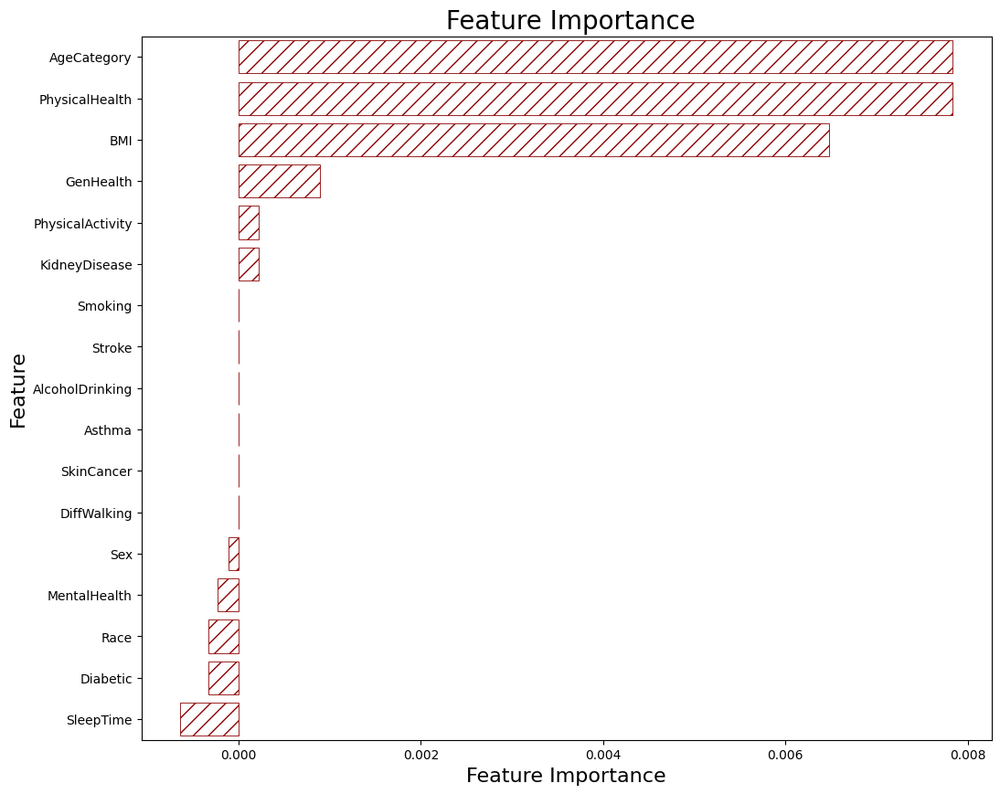

In [ ]:
X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=0.35, random_state=0)

plotFeatureimportance(logestic_simple, X_train, y_train)

In [ ]:
X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=0.35, random_state=0)

scaler= StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

logreg_s=LogisticRegression(solver="liblinear", penalty="l2", C=0.00001, max_iter=10000)
logreg_s.fit(X_train_scaled,y_train)
y_pred_log=logreg_s.predict(X_test_scaled)

y_pred_proba_log = logreg_s.predict_proba(X_test_scaled)
fpr_log, tpr_log, _ = metrics.roc_curve(y_test, y_pred_proba_log[:,1])
auc_log = round(metrics.auc(fpr_log, tpr_log),5)


simple_log = pd.DataFrame(data=[accuracy_score(y_test, y_pred_log),
                                                                    precision_score(y_test, y_pred_log, average='binary'),
                                                                    recall_score(y_test, y_pred_log, average='binary'),
                                                                    f1_score(y_test, y_pred_log, average='binary'),
                                                                    roc_auc_score(y_test, y_pred_proba_log[:,1])],
                                                                    index=['Accuracy','Precision','Recall','F1-score','AUC'],
                                                                     columns = ["Logestic_regression_simple"])

simple_log

,Logestic_regression_simple
Accuracy,0.908713
Precision,0.495630
Recall,0.141535
F1-score,0.220191
AUC,0.816226


In [ ]:
#import joblib
#model_path = '/content/drive/My Drive/logistic_regression_model.pkl'
#joblib.dump(logreg_s, model_path)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
randomforest=RandomForestClassifier()
grid={  'n_estimators': [ 50, 100, 150], 'max_features': ['sqrt', 'log2', None],
          'max_depth': [3, 6, 9,12], 'min_samples_split': [3, 6, 9],'min_samples_leaf': [3, 6, 9]}


randomforest_simple=model_hypertun(randomforest,grid, X, y)

n_iterations: 5
n_required_iterations: 6
n_possible_iterations: 5
min_resources_: 807
max_resources_: 196116
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 324
n_resources: 807
Fitting 7 folds for each of 324 candidates, totalling 2268 fits
----------
iter: 1
n_candidates: 108
n_resources: 2421
Fitting 7 folds for each of 108 candidates, totalling 756 fits
----------
iter: 2
n_candidates: 36
n_resources: 7263
Fitting 7 folds for each of 36 candidates, totalling 252 fits
----------
iter: 3
n_candidates: 12
n_resources: 21789
Fitting 7 folds for each of 12 candidates, totalling 84 fits
----------
iter: 4
n_candidates: 4
n_resources: 65367
Fitting 7 folds for each of 4 candidates, totalling 28 fits
tuned hpyerparameters :(best parameters)  {'max_depth': 12, 'max_features': None, 'min_samples_leaf': 3, 'min_samples_split': 9, 'n_estimators': 150}
f1 score : 0.14432810122612572


In [ ]:
from sklearn.ensemble import RandomForestClassifier
X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=0.35, random_state=0)

scaler= StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

randomforest_s=RandomForestClassifier(n_estimators=50, max_features=None, max_depth=12, min_samples_leaf=3,
                                     min_samples_split=6  )
randomforest_s.fit(X_train_scaled,y_train)
y_pred_rf=randomforest_s.predict(X_test_scaled)

y_pred_proba_rf = randomforest_s.predict_proba(X_test_scaled)
fpr_rf, tpr_rf, _ = metrics.roc_curve(y_test, y_pred_proba_rf[:,1])
auc_rf = round(metrics.auc(fpr_rf, tpr_rf),5)

simple_RF = pd.DataFrame(data=[accuracy_score(y_test, y_pred_rf),
                        precision_score(y_test, y_pred_rf, average='binary'),
                         recall_score(y_test, y_pred_rf, average='binary'),
                        f1_score(y_test, y_pred_rf, average='binary'),
                         roc_auc_score(y_test, y_pred_proba_rf[:,1])],
                        index=['Accuracy','Precision','Recall','F1-score','AUC'],
                        columns = ["Random_Forest_simple"])

simple_RF

,Random_Forest_simple
Accuracy,0.909736
Precision,0.527237
Recall,0.084547
F1-score,0.145725
AUC,0.830536


In [ ]:
#import joblib
#model_path = '/content/drive/My Drive/Random_Forest_model.pkl'
#joblib.dump(randomforest_s, model_path)

In [ ]:
#from sklearn.neighbors import KNeighborsClassifier
#from sklearn.model_selection import GridSearchCV

# Create a KNN model
#knn = KNeighborsClassifier()

# Define the hyperparameters to tune
#grid = {'n_neighbors': [5, 7, 9, 11, 13, 15],
#               'weights': ['uniform', 'distance'],
#               'metric': ['minkowski', 'euclidean', 'manhattan']}

# Perform hyperparameter tuning using the model_hypertun function
#knn_imbalance = model_hypertun(knn, grid, X, y)

n_iterations: 4
n_required_iterations: 4
n_possible_iterations: 4
min_resources_: 7263
max_resources_: 196116
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 36
n_resources: 7263
Fitting 7 folds for each of 36 candidates, totalling 252 fits
----------
iter: 1
n_candidates: 12
n_resources: 21789
Fitting 7 folds for each of 12 candidates, totalling 84 fits
----------
iter: 2
n_candidates: 4
n_resources: 65367
Fitting 7 folds for each of 4 candidates, totalling 28 fits
----------
iter: 3
n_candidates: 2
n_resources: 196101
Fitting 7 folds for each of 2 candidates, totalling 14 fits
tuned hpyerparameters :(best parameters)  {'metric': 'manhattan', 'n_neighbors': 5, 'weights': 'distance'}
f1 score : 0.21551259541473536


In [ ]:
X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=0.35, random_state=0)

plotFeatureimportance(randomforest_simple, X_train, y_train)

In [ ]:
X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=0.35, random_state=0)

scaler= StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

knn_s=KNeighborsClassifier(n_neighbors=5, weights='distance', metric='manhattan')
knn_s.fit(X_train_scaled,y_train)
y_pred_knn=knn_s.predict(X_test_scaled)

y_pred_proba_knn = knn_s.predict_proba(X_test_scaled)
fpr_knn, tpr_knn, _ = metrics.roc_curve(y_test, y_pred_proba_knn[:,1])
auc_knn = round(metrics.auc(fpr_knn, tpr_knn),5)

simple_knn = pd.DataFrame(data=[accuracy_score(y_test, y_pred_knn),
                        precision_score(y_test, y_pred_knn, average='binary'),
                         recall_score(y_test, y_pred_knn, average='binary'),
                        f1_score(y_test, y_pred_knn, average='binary'),
                         roc_auc_score(y_test, y_pred_proba_knn[:,1])],
                        index=['Accuracy','Precision','Recall','F1-score','AUC'],
                        columns = ["K_NeighborsClassifier_simple"])

simple_knn

,K_NeighborsClassifier_simple
Accuracy,0.890863
Precision,0.302504
Recall,0.152038
F1-score,0.202367
AUC,0.696914


In [ ]:
#import joblib
#model_path = '/content/drive/My Drive/K_NeighborsClassifier.pkl'
#joblib.dump(knn_s, model_path)

['/content/drive/My Drive/K_NeighborsClassifier.pkl']

# ***Results of Imbalenced Model***

In [ ]:
simple_model=simple_log.join(simple_RF).join(simple_knn)
compare1=simple_model.transpose()
compare1

,Accuracy,Precision,Recall,F1-score,AUC
Logestic_regression_simple,0.908713,0.495630,0.141535,0.220191,0.816226
Random_Forest_simple,0.910323,0.549863,0.083715,0.145307,0.830933
K_NeighborsClassifier_simple,0.890863,0.302504,0.152038,0.202367,0.696914


In [ ]:
from plotly.subplots import make_subplots
import plotly.graph_objs as go
fig = make_subplots(rows=1,cols=2, specs=[[{"type": "Heatmap"},{"type": "Heatmap"}] ],
                    subplot_titles=("Logestic Confusion Matrix", "Random Forest Confusion Matrix","KNN_KNeighborsClassifier"),horizontal_spacing=0.09)


#logestic

confusion_matrix_logb = metrics.confusion_matrix(y_test, y_pred_log)
confusion_matrix_logb = confusion_matrix_logb.astype(int)
logreg_b_conf=metrics.confusion_matrix(y_test, y_pred_log)


color_scale = [[0, 'lightcyan'], #0
              [.1, 'blue'], #.1
              [.2, 'LightSkyBlue'], #.2
              [.3, 'DeepSkyBlue'], #.3
              [.4, 'DodgerBlue'], #.4
              [.5, 'CornflowerBlue'], #.5
              [.6, 'MediumSlateBlue'], #.6
              [.7, 'RoyalBlue'], #.7
              [.8, 'MediumBlue'], #.8
              [.9, 'DarkBlue'], #.9
              [1., 'navy'], #1
              ]


fig.add_trace(go.Heatmap(z=confusion_matrix_logb,
                                    x=logreg_s.classes_,
                                    y=logreg_s.classes_,
                                    hoverongaps=False,
                                    text=[[(logreg_b_conf[0][0] ," True Positive"), (logreg_b_conf[0][1]," False Positive")],
                                          [(logreg_b_conf[1][0]," False Negative"), (logreg_b_conf[1][1] ," True Negative")]],
                                    texttemplate="%{text}",
                                    textfont={"size":10},
                                    colorscale = color_scale,showscale=False,
                                    colorbar = dict(tickvals=[0, .2, .4, .6, .8, 1])),row=1,col=1)




#RandomForest

confusion_matrix_rfb = metrics.confusion_matrix(y_test, y_pred_rf)
confusion_matrix_rfb = confusion_matrix_rfb.astype(int)
randomforest_b_conf=metrics.confusion_matrix(y_test, y_pred_rf)


color_scale = [[0, 'lightcyan'], #0
              [.1, 'blue'], #.1
              [.2, 'LightSkyBlue'], #.2
              [.3, 'DeepSkyBlue'], #.3
              [.4, 'DodgerBlue'], #.4
              [.5, 'CornflowerBlue'], #.5
              [.6, 'MediumSlateBlue'], #.6
              [.7, 'RoyalBlue'], #.7
              [.8, 'MediumBlue'], #.8
              [.9, 'DarkBlue'], #.9
              [1., 'navy'], #1
              ]


fig.add_trace(go.Heatmap(z=confusion_matrix_rfb,
                                    x=randomforest_s.classes_,
                                    y=randomforest_s.classes_,
                                    hoverongaps=False,
                                    text=[[(randomforest_b_conf[0][0] ," True Positive"), (randomforest_b_conf[0][1]," False Positive")],
                                          [(randomforest_b_conf[1][0]," False Negative"), (randomforest_b_conf[1][1] ," True Negative")]],
                                    texttemplate="%{text}",
                                    textfont={"size":10},
                                    colorscale = color_scale,showscale=False,
                                    colorbar = dict(tickvals=[0, .2, .4, .6, .8, 1])),row=1,col=2)















#knn

#confusion_matrix_knnb = metrics.confusion_matrix(y_test, y_pred_rf)
#confusion_matrix_knnb = confusion_matrix_knnb.astype(int)
#knn_b_conf=metrics.confusion_matrix(y_test, y_pred_rf)


#color_scale = [[0, 'lightcyan'], #0
#              [.1, 'blue'], #.1
#              [.2, 'LightSkyBlue'], #.2
#              [.3, 'DeepSkyBlue'], #.3
#              [.4, 'DodgerBlue'], #.4
#              [.5, 'CornflowerBlue'], #.5
#              [.6, 'MediumSlateBlue'], #.6
#              [.7, 'RoyalBlue'], #.7
#              [.8, 'MediumBlue'], #.8
#              [.9, 'DarkBlue'], #.9
#              [1., 'navy'], #1
#              ]


#fig.add_trace(go.Heatmap(z=confusion_matrix_knnb,
#                                   x=knn_s.classes_,
#                                    y=knn_s.classes_,
#                                    hoverongaps=False,
#                                    text=[[(knn_b_conf[0][0] ," True Positive"), (knn_b_conf[0][1]," False Positive")],
#                                          [(knn_b_conf[1][0]," False Negative"), (knn_b_conf[1][1] ," True Negative")]],
#                                    texttemplate="%{text}",
#                                    textfont={"size":10},
#                                    colorscale = color_scale,showscale=False,
#                                    colorbar = dict(tickvals=[0, .2, .4, .6, .8, 1])),row=1,col=2)

# ***Model with Class_weight="balanced"***

In [ ]:
from sklearn.utils.class_weight import compute_class_weight

# Ensure y_we is an array-like object with integer class labels
y_we = df["HeartDisease"].astype(int)


# Calculate class weighting
weighting = compute_class_weight(class_weight='balanced', classes=np.unique(y_we), y=y_we)
print("class_weight 0: ", weighting[0], "class_weight 1: ", weighting[1])

class_weight 0:  0.5496636983705949 class_weight 1:  5.533857892226991


class_weight 0:  0.5496636983705949 class_weight 1:  5.533857892226991


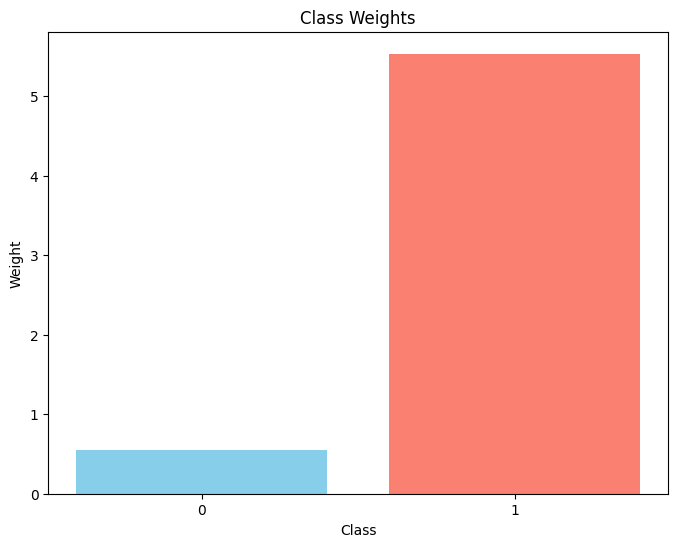

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.utils.class_weight import compute_class_weight

# Ensure y_we is an array-like object with integer class labels
y_we = df["HeartDisease"].astype(int)

# Calculate class weighting
weighting = compute_class_weight(class_weight='balanced', classes=np.unique(y_we), y=y_we)
print("class_weight 0: ", weighting[0], "class_weight 1: ", weighting[1])

# Create a bar plot for class weights
plt.figure(figsize=(8, 6))
plt.bar(np.unique(y_we), weighting, color=['skyblue', 'salmon'])
plt.xlabel('Class')
plt.ylabel('Weight')
plt.title('Class Weights')
plt.xticks(np.unique(y_we))
plt.show()

In [ ]:
logreg=LogisticRegression()
grid = [{'solver':['lbfgs', 'newton-cg', 'sag', 'saga'], 'penalty':['none'],
                  "max_iter":[1000,5000,10000],"class_weight":["balanced"]},
                 {'solver':['lbfgs', 'newton-cg', 'sag'], 'penalty':['l2'],
                  'C': np.logspace(-5, 5, 10), "max_iter":[1000,5000,10000],"class_weight":["balanced"]},
                 {'solver':['liblinear', 'saga'], 'penalty': ['l1', 'l2'],
                  'C': np.logspace(-5, 5, 10), "max_iter":[1000,5000,10000],"class_weight":["balanced"]},
                 {'solver':['saga'], 'penalty':['elasticnet'], 'C': np.logspace(-5, 5, 10),
                  'l1_ratio': np.arange(0,1.1,0.1), "max_iter":[1000,5000,10000],"class_weight":["balanced"]}]

logestic_balance=model_hypertun(logreg,grid, X, y)

n_iterations: 5
n_required_iterations: 6
n_possible_iterations: 5
min_resources_: 807
max_resources_: 196116
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 552
n_resources: 807
Fitting 7 folds for each of 552 candidates, totalling 3864 fits
----------
iter: 1
n_candidates: 184
n_resources: 2421
Fitting 7 folds for each of 184 candidates, totalling 1288 fits
----------
iter: 2
n_candidates: 62
n_resources: 7263
Fitting 7 folds for each of 62 candidates, totalling 434 fits
----------
iter: 3
n_candidates: 21
n_resources: 21789
Fitting 7 folds for each of 21 candidates, totalling 147 fits
----------
iter: 4
n_candidates: 7
n_resources: 65367
Fitting 7 folds for each of 7 candidates, totalling 49 fits
tuned hpyerparameters :(best parameters)  {'C': 0.021544346900318846, 'class_weight': 'balanced', 'l1_ratio': 0.5, 'max_iter': 10000, 'penalty': 'elasticnet', 'solver': 'saga'}
f1 score : 0.35331143821755806


In [ ]:
X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=0.35, random_state=0)

scaler= StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

logreg_b=LogisticRegression(solver="saga", penalty="elasticnet", l1_ratio=0, C=0.0016681005372000592, max_iter=5000,class_weight="balanced")
logreg_b.fit(X_train_scaled,y_train)
y_pred_logb=logreg_b.predict(X_test_scaled)

y_pred_proba_logb = logreg_b.predict_proba(X_test_scaled)
fpr_logb, tpr_logb, _ = metrics.roc_curve(y_test, y_pred_proba_logb[:,1])
auc_logb = round(metrics.auc(fpr_logb, tpr_logb),5)




balanced_log = pd.DataFrame(data=[accuracy_score(y_test, y_pred_logb),
                           precision_score(y_test, y_pred_logb, average='binary'),
                            recall_score(y_test, y_pred_logb, average='binary'),
                            f1_score(y_test, y_pred_logb, average='binary'),
                            roc_auc_score(y_test, y_pred_proba_logb[:,1])],
                            index=['Accuracy','Precision','Recall','F1-score','AUC'],
                            columns = ["Logestic_regression_balanced"])

balanced_log

,Logestic_regression_balanced
Accuracy,0.742152
Precision,0.228655
Recall,0.771735
F1-score,0.352785
AUC,0.831988


In [ ]:
#import joblib
#model_path = '/content/drive/My Drive/Logistic_Regression_balencedmodel.pkl'
#joblib.dump(logreg_b, model_path)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

randomforest=RandomForestClassifier()
grid={'n_estimators': [ 50, 100, 150], 'max_features': ['sqrt', 'log2', None],
          'max_depth': [3, 6, 9,12], 'min_samples_split': [3, 6, 9],'min_samples_leaf': [3, 6, 9],"class_weight":["balanced"]}




randomforest_balance=model_hypertun(randomforest,grid, X, y)

n_iterations: 5
n_required_iterations: 6
n_possible_iterations: 5
min_resources_: 807
max_resources_: 196116
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 324
n_resources: 807
Fitting 7 folds for each of 324 candidates, totalling 2268 fits
----------
iter: 1
n_candidates: 108
n_resources: 2421
Fitting 7 folds for each of 108 candidates, totalling 756 fits
----------
iter: 2
n_candidates: 36
n_resources: 7263
Fitting 7 folds for each of 36 candidates, totalling 252 fits
----------
iter: 3
n_candidates: 12
n_resources: 21789
Fitting 7 folds for each of 12 candidates, totalling 84 fits
----------
iter: 4
n_candidates: 4
n_resources: 65367
Fitting 7 folds for each of 4 candidates, totalling 28 fits
tuned hpyerparameters :(best parameters)  {'class_weight': 'balanced', 'max_depth': 12, 'max_features': 'log2', 'min_samples_leaf': 9, 'min_samples_split': 3, 'n_estimators': 100}
f1 score : 0.35823293996457906


In [ ]:
X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=0.35, random_state=0)

scaler= StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

randomforest_b=RandomForestClassifier(n_estimators=100 ,max_features="log2", max_depth=12,
                                                                            min_samples_leaf=9,min_samples_split=3, class_weight="balanced")
randomforest_b.fit(X_train_scaled,y_train)
y_pred_rfb=randomforest_b.predict(X_test_scaled)

y_pred_proba_rfb = randomforest_b.predict_proba(X_test_scaled)
fpr_rfb, tpr_rfb, _ = metrics.roc_curve(y_test, y_pred_proba_rfb[:,1])
auc_rfb = round(metrics.auc(fpr_rfb, tpr_rfb),5)



balanced_rfb = pd.DataFrame(data=[accuracy_score(y_test, y_pred_rfb),
                            precision_score(y_test, y_pred_rfb, average='binary'),
                            recall_score(y_test, y_pred_rfb, average='binary'),
                            f1_score(y_test, y_pred_rfb, average='binary'),
                            roc_auc_score(y_test, y_pred_proba_rfb[:,1])],
                            index=['Accuracy','Precision','Recall','F1-score','AUC'],
                            columns = ["Random_Forest_balanced"])

balanced_rfb

,Random_Forest_balanced
Accuracy,0.749065
Precision,0.233362
Recall,0.768303
F1-score,0.357989
AUC,0.832611


In [ ]:
#import joblib
#model_path = '/content/drive/My Drive/Random_Forest_balencedmodel.pkl'
#joblib.dump(randomforest_b, model_path)

# ***Result of class weight= "balanced"***

In [ ]:
balanced_model=balanced_log.join(balanced_rfb)
compare2=balanced_model.transpose()
compare2

,Accuracy,Precision,Recall,F1-score,AUC
Logestic_regression_balanced,0.742152,0.228655,0.771735,0.352785,0.831988
Random_Forest_balanced,0.749065,0.233362,0.768303,0.357989,0.832611


In [ ]:
fig = make_subplots(rows=1,cols=2, specs=[[{"type": "Heatmap"},{"type": "Heatmap"}] ],
                    subplot_titles=("Logestic Confusion Matrix", "Random Forest Confusion Matrix"),horizontal_spacing=0.09)


#logestic

confusion_matrix_logb = metrics.confusion_matrix(y_test, y_pred_logb)
confusion_matrix_logb = confusion_matrix_logb.astype(int)
logreg_b_conf=metrics.confusion_matrix(y_test, y_pred_logb)


color_scale = [[0, 'lightcyan'], #0
              [.1, 'blue'], #.1
              [.2, 'LightSkyBlue'], #.2
              [.3, 'DeepSkyBlue'], #.3
              [.4, 'DodgerBlue'], #.4
              [.5, 'CornflowerBlue'], #.5
              [.6, 'MediumSlateBlue'], #.6
              [.7, 'RoyalBlue'], #.7
              [.8, 'MediumBlue'], #.8
              [.9, 'DarkBlue'], #.9
              [1., 'navy'], #1
              ]


fig.add_trace(go.Heatmap(z=confusion_matrix_logb,
                                    x=logreg_b.classes_,
                                    y=logreg_b.classes_,
                                    hoverongaps=False,
                                    text=[[(logreg_b_conf[0][0] ," True Positive"), (logreg_b_conf[0][1]," False Positive")],
                                          [(logreg_b_conf[1][0]," False Negative"), (logreg_b_conf[1][1] ," True Negative")]],
                                    texttemplate="%{text}",
                                    textfont={"size":10},
                                    colorscale = color_scale,showscale=False,
                                    colorbar = dict(tickvals=[0, .2, .4, .6, .8, 1])),row=1,col=1)




#RandomForest

confusion_matrix_rfb = metrics.confusion_matrix(y_test, y_pred_rfb)
confusion_matrix_rfb = confusion_matrix_rfb.astype(int)
randomforest_b_conf=metrics.confusion_matrix(y_test, y_pred_rfb)


color_scale = [[0, 'lightcyan'], #0
              [.1, 'blue'], #.1
              [.2, 'LightSkyBlue'], #.2
              [.3, 'DeepSkyBlue'], #.3
              [.4, 'DodgerBlue'], #.4
              [.5, 'CornflowerBlue'], #.5
              [.6, 'MediumSlateBlue'], #.6
              [.7, 'RoyalBlue'], #.7
              [.8, 'MediumBlue'], #.8
              [.9, 'DarkBlue'], #.9
              [1., 'navy'], #1
              ]


fig.add_trace(go.Heatmap(z=confusion_matrix_rfb,
                                    x=randomforest_b.classes_,
                                    y=randomforest_b.classes_,
                                    hoverongaps=False,
                                    text=[[(randomforest_b_conf[0][0] ," True Positive"), (randomforest_b_conf[0][1]," False Positive")],
                                          [(randomforest_b_conf[1][0]," False Negative"), (randomforest_b_conf[1][1] ," True Negative")]],
                                    texttemplate="%{text}",
                                    textfont={"size":10},
                                    colorscale = color_scale,showscale=False,
                                    colorbar = dict(tickvals=[0, .2, .4, .6, .8, 1])),row=1,col=2)